<a href="https://colab.research.google.com/github/vijay9908/ML_works/blob/master/ml_project_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pygal

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import pygal
import json
import random
import seaborn as sns
from sklearn.cluster import DBSCAN
import warnings
import time
warnings.filterwarnings("ignore")

In [ ]:
from IPython.display import display, HTML
base_html = """
<!DOCTYPE html>
<html>
  <head>
  <script type="text/javascript" src="http://kozea.github.com/pygal.js/javascripts/svg.jquery.js"></script>
  <script type="text/javascript" src="https://kozea.github.io/pygal.js/2.0.x/pygal-tooltips.min.js""></script>
  </head>
  <body>
    <figure>
      {rendered_chart}
    </figure>
  </body>
</html>
"""

In [ ]:
import numpy as np
a = np.random.randn(20)
print(a)
mask = np.random.choice([1, 0], a.shape, p=[.1, .9]).astype(bool)
a[mask] = np.nan

[ 0.51734299 -0.41468147  0.82940996 -1.2288749  -0.99628422 -0.02258597
 -0.78545646 -0.07469197 -0.01783386 -1.23470212  0.01131531  0.46527449
 -1.00552986 -0.51667529 -0.15260816 -0.57699946 -0.26276143  0.61927267
  1.06967834  0.15389405]


In [ ]:
id_list = [i for i in range(1, 1001)]


json_data = []
for i in range(30000):
    r1 = random.randint(1,11)
    r2 = random.choice([1,2,3])
    d = {}
    id = random.choice(id_list)
    d['id'] = id
    d['timestamp'] = random.randint(1630741501, 1631951101) #random.randint(1)
    d['latitude'] = round(random.uniform(75, 81), 6)
    d['longitude'] = round(random.uniform(15, 21), 6)
    if r1==10 and r2==1:
      d['longitude'] = np.nan
    elif r1==10 and r2==2:
      d['latitude'] = np.nan
    json_data.append(d)

final_data = json.dumps(json_data)

In [ ]:
df = pd.read_json(final_data)
df.to_csv('/content/drive/MyDrive/ml-project/dataset.csv',index = False)

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ml-project/dataset.csv')

In [ ]:
df.describe()
df.transpose()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,29960,29961,29962,29963,29964,29965,29966,29967,29968,29969,29970,29971,29972,29973,29974,29975,29976,29977,29978,29979,29980,29981,29982,29983,29984,29985,29986,29987,29988,29989,29990,29991,29992,29993,29994,29995,29996,29997,29998,29999
id,549,594,198,516,968,919,433,44,973,64,305,273,454,477,632,938,755,738,826,239,209,266,786,197,379,518,396,775,359,843,960,510,32,882,898,894,523,31,463,454,...,633,474,10,693,418,132,649,609,292,909,319,938,440,624,772,149,340,97,411,84,530,373,317,180,186,547,478,757,934,14,592,392,967,464,561,692,629,560,613,201
timestamp,2021-09-11 21:07:16,2021-09-11 06:58:34,2021-09-13 22:32:24,2021-09-05 20:01:34,2021-09-05 15:01:50,2021-09-09 09:20:07,2021-09-15 15:51:09,2021-09-08 12:34:02,2021-09-14 18:41:33,2021-09-10 10:26:31,2021-09-12 02:28:50,2021-09-12 15:48:54,2021-09-12 17:13:48,2021-09-10 22:12:08,2021-09-17 12:54:29,2021-09-08 12:00:30,2021-09-13 14:27:51,2021-09-06 05:56:53,2021-09-07 21:14:41,2021-09-07 19:23:53,2021-09-16 06:42:46,2021-09-06 00:08:58,2021-09-07 00:43:38,2021-09-07 03:11:07,2021-09-06 16:36:08,2021-09-11 10:09:29,2021-09-11 22:21:37,2021-09-06 14:15:25,2021-09-09 09:32:18,2021-09-12 22:23:37,2021-09-07 09:04:21,2021-09-17 05:41:00,2021-09-10 01:23:15,2021-09-13 23:34:40,2021-09-12 14:25:04,2021-09-04 15:38:49,2021-09-08 10:04:38,2021-09-07 22:35:41,2021-09-14 18:30:42,2021-09-17 17:12:04,...,2021-09-04 09:01:03,2021-09-13 00:16:22,2021-09-18 04:18:33,2021-09-08 20:23:34,2021-09-08 11:40:11,2021-09-16 22:54:25,2021-09-14 06:00:42,2021-09-11 09:13:14,2021-09-10 05:56:48,2021-09-11 04:21:01,2021-09-07 04:38:57,2021-09-17 07:55:18,2021-09-17 06:01:41,2021-09-18 02:34:58,2021-09-13 23:11:46,2021-09-16 07:56:58,2021-09-07 02:47:56,2021-09-09 21:26:39,2021-09-14 19:34:47,2021-09-17 12:54:19,2021-09-14 18:04:41,2021-09-04 09:25:41,2021-09-04 19:59:33,2021-09-13 15:15:31,2021-09-16 00:03:56,2021-09-05 11:21:47,2021-09-16 15:57:30,2021-09-15 06:08:58,2021-09-07 13:13:37,2021-09-05 18:09:30,2021-09-08 17:42:43,2021-09-06 14:34:07,2021-09-11 18:03:53,2021-09-11 12:30:23,2021-09-06 23:37:14,2021-09-10 23:51:29,2021-09-10 00:03:19,2021-09-13 12:19:58,2021-09-12 20:09:38,2021-09-08 18:05:32
latitude,80.6472,77.4668,79.0171,78.7024,79.1768,76.6111,78.0677,78.865,79.9743,78.1557,79.6266,78.1629,NaN,NaN,78.576,75.3577,76.7288,80.492,78.4556,78.0054,80.7402,78.6097,80.7012,75.41,76.7619,75.7794,76.7476,80.569,79.5016,75.2059,76.5657,78.1144,77.0715,78.2351,80.9047,77.7834,76.8143,78.0801,78.1188,78.7652,...,78.3482,80.2556,76.6465,77.2545,76.6052,78.4499,76.7,77.3784,76.2373,76.3031,78.7793,76.7662,78.9208,78.5346,76.907,75.8479,77.4182,75.3049,75.7744,78.1405,77.8491,79.6498,79.3437,NaN,78.9656,80.6596,80.4871,80.3106,75.1626,79.6912,78.4455,79.1937,75.8436,76.0883,75.009,78.6308,76.5817,76.5834,76.9558,78.9873
longitude,17.0907,16.4619,16.0967,20.0249,20.5564,19.2173,15.6303,20.4796,18.2414,16.25,16.2767,18.2072,19.8117,16.0164,19.7938,16.619,16.8061,18.0852,19.4438,18.8044,19.1137,20.5889,18.976,20.4431,16.8445,20.1816,18.2005,17.2794,17.1409,17.3159,20.2893,15.2635,16.823,17.6941,20.2597,15.8436,20.1319,15.8891,15.7913,16.1208,...,15.9648,19.4537,20.7186,18.2459,15.1265,17.4829,18.6346,20.6188,16.6556,18.9299,16.108,17.0607,NaN,15.4876,16.0981,16.9802,18.4371,20.9457,16.8679,16.7465,19.7168,18.1018,19.9788,15.0026,20.8261,19.6133,19.8028,20.6972,16.8387,NaN,15.1945,17.315,15.0688,19.2271,18.1704,16.5841,19.1162,18.9194,19.127,15.8052


In [ ]:
df.shape

(30000, 4)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   id         30000 non-null  int64         
 1   timestamp  30000 non-null  datetime64[ns]
 2   latitude   29082 non-null  float64       
 3   longitude  29091 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 937.6 KB


In [ ]:
df.isnull().sum()

id             0
timestamp      0
latitude     918
longitude    909
dtype: int64

In [ ]:
dataFrame = pd.read_json(final_data)
dataFrame.head()

,id,timestamp,latitude,longitude
0,549,2021-09-11 21:07:16,80.647163,17.090668
1,594,2021-09-11 06:58:34,77.466753,16.461873
2,198,2021-09-13 22:32:24,79.017075,16.096714
3,516,2021-09-05 20:01:34,78.702412,20.024879
4,968,2021-09-05 15:01:50,79.176802,20.556403


In [ ]:
df.groupby(['id','latitude','longitude']).count()

timestamp
id   latitude  longitude           
1    75.296618 18.919733          1
     75.313564 20.720204          1
     75.372688 18.418108          1
     75.801308 17.157900          1
     76.124129 19.809928          1
...                             ...
1000 80.135497 17.302245          1
     80.523363 16.990795          1
     80.619656 16.113716          1
     80.814048 20.658881          1
     80.912807 17.090378          1

[28173 rows x 1 columns]

<Figure size 3000x2000 with 0 Axes>

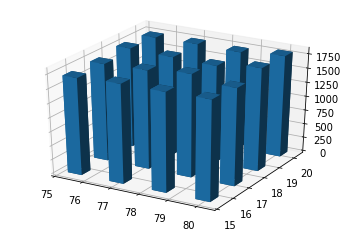

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Fixing random state for reproducibility
np.random.seed(19680801)

plt.figure(figsize=(3, 2), dpi=1000)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
x, y = df['latitude'], df['longitude']

hist, xedges, yedges = np.histogram2d(x, y, bins=4, range=[[75, 81], [15, 21]])

xpos, ypos = np.meshgrid(xedges[:-1] + 0.25, yedges[:-1] + 0.25, indexing="ij")
xpos = xpos.ravel()
ypos = ypos.ravel()
zpos = 0

dx = dy = 0.5 * np.ones_like(zpos)
dz = hist.ravel()

ax.bar3d(xpos, ypos, zpos, dx, dy, dz, zsort='average')

plt.show()

In [ ]:
#dataFrame = df
dataFrame.dropna(inplace=True)
df = dataFrame
df.isnull().sum()
df = df.reset_index(drop=True)
dataFrame = df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28173 entries, 0 to 28172
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         28173 non-null  int64  
 1   timestamp  28173 non-null  object 
 2   latitude   28173 non-null  float64
 3   longitude  28173 non-null  float64
dtypes: float64(2), int64(1), object(1)
memory usage: 880.5+ KB


In [ ]:
df.to_csv('/content/drive/MyDrive/ml-project/Filtered_dataset.csv')

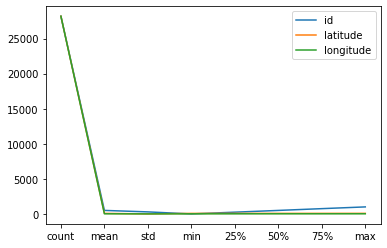

In [ ]:
#df = df[['id','timestamp','latitude','longitude']]
#df.head()
df.describe().plot()

In [ ]:
df.shape

(28173, 4)

In [ ]:
safe_distance = 0.0018288            # A radial distance of 6 feet in kilometers
model = DBSCAN(eps=safe_distance, min_samples=2, metric='haversine').fit(dataFrame[['latitude', 'longitude']])
core_samples_mask = np.zeros_like(model.labels_, dtype=bool)
core_samples_mask[model.core_sample_indices_] = True
labels = model.labels_
dataFrame['Cluster'] = model.labels_.tolist()

In [ ]:
df.iloc[2]
df.tail()

,id,timestamp,latitude,longitude,Cluster
28168,692,2021-09-10 23:51:29,78.630797,16.584108,-1
28169,629,2021-09-10 00:03:19,76.581712,19.116247,313
28170,560,2021-09-13 12:19:58,76.583427,18.919431,-1
28171,613,2021-09-12 20:09:38,76.955791,19.126997,-1
28172,201,2021-09-08 18:05:32,78.987295,15.805226,-1


In [ ]:
p='%Y-%m-%d %H:%M:%S'

In [ ]:
diff = abs(1630741501-1631951101)//14

def plot_by_timestamp(initial, title):
  res = []
  for i in range(int(df.shape[0])):
    epoch1 = int(time.mktime(time.strptime(str(df.loc[i]['timestamp']),p)))
    if epoch1 >= initial and epoch1 <= initial+diff:
      res.append(df.iloc[i])

  x = [res[i]['latitude'] for i in range(len(res))]
  y = [res[i]['longitude'] for i in range(len(res))]
  hue = [res[i]['id'] for i in range(len(res))]
  sns.scatterplot(x, y,hue=hue)
  plt.title(title)
  plt.xlabel("Latitude")
  plt.ylabel("Longitude")
  plt.show()  

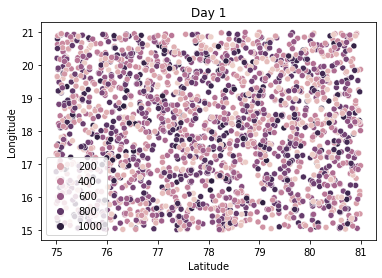

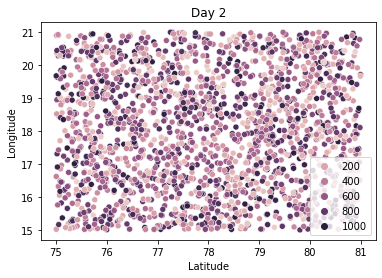

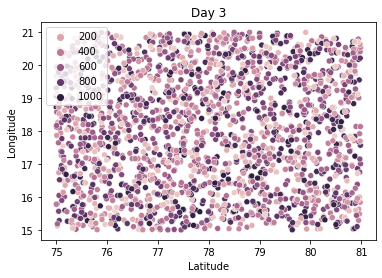

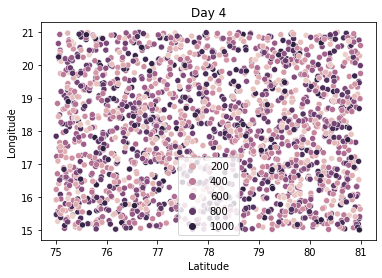

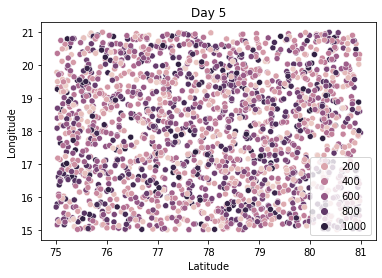

...

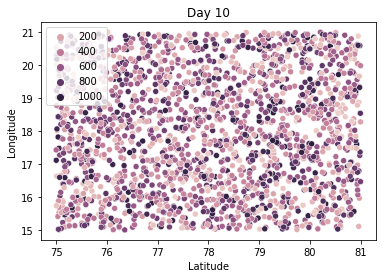

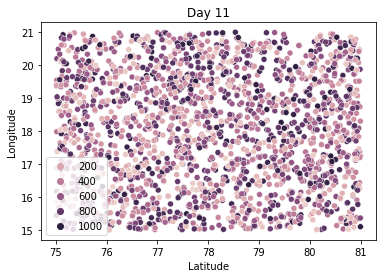

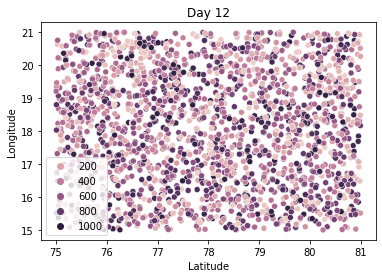

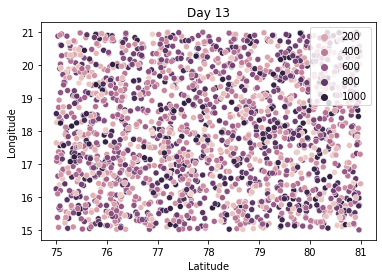

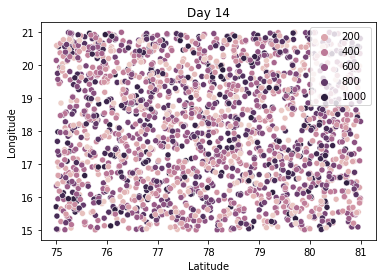

In [ ]:
initial = 1630741501
for i in range(14):
  plot_by_timestamp(initial + i*diff, f"Day {i+1}")

In [ ]:
disp_dict_clust = {}
for index, row in dataFrame.iterrows():
    if row['Cluster'] not in disp_dict_clust.keys():
        disp_dict_clust[row['Cluster']] = [(row['latitude'], row['longitude'])]
    else:
        disp_dict_clust[row['Cluster']].append((row['latitude'], row['longitude']))

print(len(disp_dict_clust.keys()))

from pygal.style import LightenStyle

dark_lighten_style = LightenStyle('#F35548')
xy_chart = pygal.XY(stroke=False, style=dark_lighten_style, s=5)
[xy_chart.add(str(k),v) for k,v in disp_dict_clust.items()]
display(HTML(base_html.format(rendered_chart=xy_chart.render(is_unicode=True))))

685


In [ ]:
for name in range(1, 1001):
    inputName = name
    inputNameClusters = set()
    for i in range(len(dataFrame)):
        if dataFrame['id'][i] == inputName:
            inputNameClusters.add(dataFrame['Cluster'][i])
    infected = set()
    for cluster in inputNameClusters:
        if cluster != -1:
            namesInCluster = dataFrame.loc[dataFrame['Cluster'] == cluster, 'id']
            for i in range(len(namesInCluster)):
                name = namesInCluster.iloc[i]
                if name != inputName:
                    infected.add(name)

In [ ]:
def contactTracing(dataFrame, inputName):
    assert (inputName in dataFrame['id'].tolist()), "User Doesn't exist"
    safe_distance = 0.0018288 #6 feets in kilometers
    #Apply model, in case of larger dataset or noisy one, increase min_samples
    model = DBSCAN(eps=safe_distance, min_samples=2, metric='haversine').fit(dataFrame[['latitude', 'longitude']])
    labels = model.labels_
    dataFrame['Cluster'] = model.labels_.tolist()

    inputNameClusters = set()
    for i in range(len(dataFrame)):
        if dataFrame['id'][i] == inputName:
            inputNameClusters.add(dataFrame['Cluster'][i])
         
    infected = set()
    for cluster in inputNameClusters:
        if cluster != -1:
            namesInCluster = dataFrame.loc[dataFrame['Cluster'] == cluster, 'id']
            for i in range(len(namesInCluster)):
                name = namesInCluster.iloc[i]
                if name != inputName: #Don't want to add the input to the results
                    infected.add(name)
    print("Possible infections are from ID's: ")
    print(*infected, sep =", " )

In [ ]:
contactTracing(dataFrame, 5)

Possible infections are from ID's: 
770, 175
